In [1]:
# Cell 0 - Install required packages (run once at start)
!apt-get install -y cmake


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
cmake is already the newest version (3.22.1-1ubuntu1.22.04.2).
0 upgraded, 0 newly installed, 0 to remove and 87 not upgraded.


In [2]:
!pip install opencv-python dlib imutils


In [3]:
!pip install mediapipe

In [29]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow debug/info/warning logs

In [30]:
# Cell 1 - Imports and MediaPipe initialization

import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import os
from glob import glob

# Initialize MediaPipe Face Mesh
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=True, min_detection_confidence=0.5)

# Drawing utilities
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles


W0000 00:00:1748906796.686955     409 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1748906796.707200     410 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


In [31]:
# Cell 2 - Helper functions (same as before)

def show_image(img, title="Image"):
    plt.figure(figsize=(10,8))
    if len(img.shape) == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

def apply_clahe_adaptive(gray_img):
    mean_brightness = np.mean(gray_img)
    clipLimit = 2.0 if mean_brightness > 100 else 4.0
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=(8,8))
    return clahe.apply(gray_img)

def adjust_gamma_adaptive(image):
    mean = np.mean(image)
    if mean < 50:
        gamma = 1.8
    elif mean < 100:
        gamma = 1.4
    else:
        gamma = 1.0
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(256)]).astype("uint8")
    return cv2.LUT(image, table), gamma

def bilateral_smooth(image):
    return cv2.bilateralFilter(image, d=7, sigmaColor=50, sigmaSpace=50)

def euclidean_dist(point1, point2):
    return np.linalg.norm(np.array(point1) - np.array(point2))

def eye_aspect_ratio(landmarks, eye_points):
    p1 = landmarks[eye_points[0]]
    p2 = landmarks[eye_points[1]]
    p3 = landmarks[eye_points[2]]
    p4 = landmarks[eye_points[3]]
    p5 = landmarks[eye_points[4]]
    p6 = landmarks[eye_points[5]]
    vertical1 = euclidean_dist(p2, p6)
    vertical2 = euclidean_dist(p3, p5)
    horizontal = euclidean_dist(p1, p4)
    ear = (vertical1 + vertical2) / (2.0 * horizontal)
    return ear

def mouth_aspect_ratio(landmarks, mouth_points):
    p12 = landmarks[mouth_points[0]]
    p13 = landmarks[mouth_points[1]]
    p14 = landmarks[mouth_points[2]]
    p15 = landmarks[mouth_points[3]]
    p16 = landmarks[mouth_points[4]]
    p17 = landmarks[mouth_points[5]]
    p18 = landmarks[mouth_points[6]]
    p19 = landmarks[mouth_points[7]]
    vertical1 = euclidean_dist(p13, p19)
    vertical2 = euclidean_dist(p14, p18)
    vertical3 = euclidean_dist(p15, p17)
    horizontal = euclidean_dist(p12, p16)
    mar = (vertical1 + vertical2 + vertical3) / (2.0 * horizontal)
    return mar


In [45]:
import os
from glob import glob

dataset_root = '/kaggle/input/drowsyyy/Imagess'  # your dataset root

# Get list of person subfolders
person_folders = [f.path for f in os.scandir(dataset_root) if f.is_dir()]

print("Found persons:", [os.path.basename(p) for p in person_folders])

images_per_person = {}

# Image extensions to look for
image_extensions = ('*.jpg', '*.jpeg', '*.png', '*.bmp')

for person_folder in person_folders:
    person_name = os.path.basename(person_folder)
    image_paths = []
    for ext in image_extensions:
        image_paths.extend(glob(os.path.join(person_folder, ext)))
    image_paths = sorted(image_paths)
    images_per_person[person_name] = image_paths
    print(f"Person '{person_name}' has {len(image_paths)} images")


Found persons: ['Mo_Drowsy', 'OS', 'Zorkany']
Person 'Mo_Drowsy' has 10 images
Person 'OS' has 8 images
Person 'Zorkany' has 10 images



Processing person 'Mo_Drowsy' with 10 images
Image 1/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0001.jpg
Showing preprocessing steps for sample image 1 of 'Mo_Drowsy'


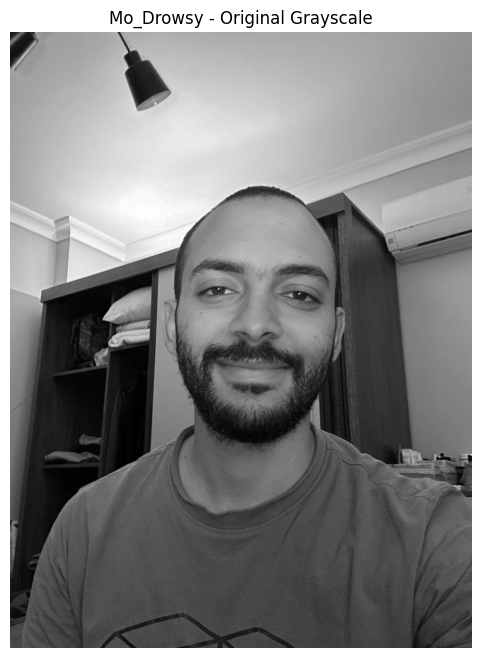

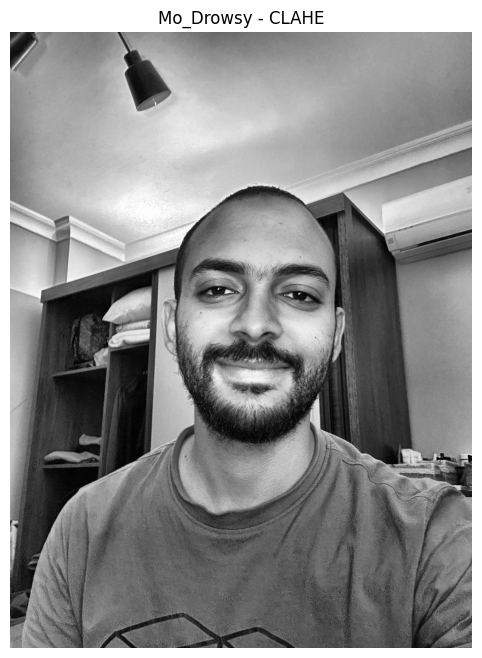

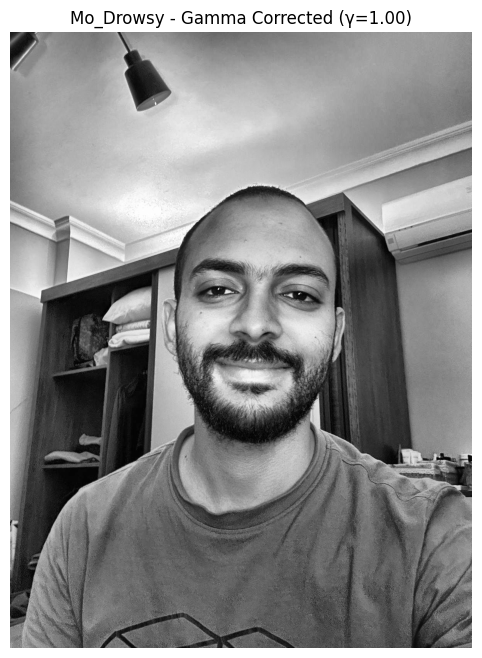

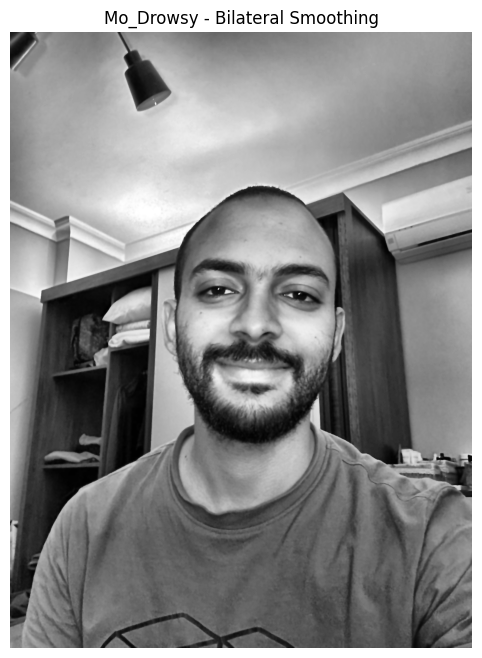

EAR: 0.226, MAR: 0.009
Image 2/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0003.jpg
EAR: 0.263, MAR: 0.000
Image 3/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0004.jpg
EAR: 0.043, MAR: 0.004
Image 4/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0005.jpg
EAR: 0.029, MAR: 1.158
Image 5/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0006.jpg
EAR: 0.280, MAR: 0.010
Image 6/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0007.jpg
EAR: 0.066, MAR: 1.464
Image 7/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0008.jpg
EAR: 0.047, MAR: 1.171
Image 8/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0009.jpg
EAR: 0.022, MAR: 0.009
Image 9/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/IMG-20250603-WA0010.jpg
EAR: 0.265, MAR: 0.012
Image 10/10: /kaggle/input/drowsyyy/Imagess/Mo_Drowsy/WhatsApp Image 2025-06-03 at 00.33.44_b9f1ee9b.jpg
EAR: 0.191, MAR: 0.277

Processing person 'OS' with 8 images
Image 1/8: 

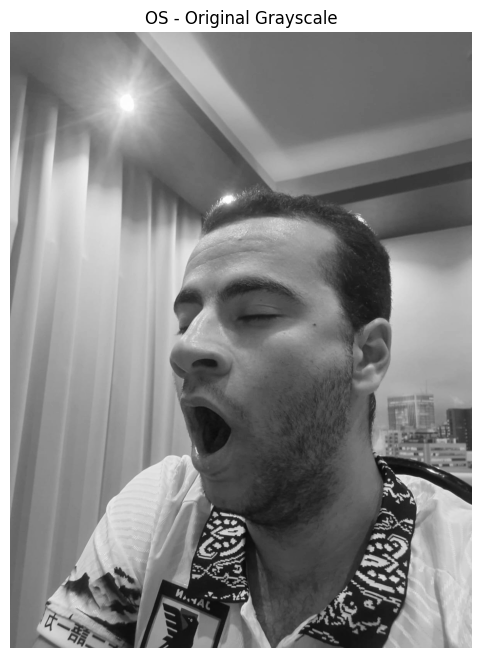

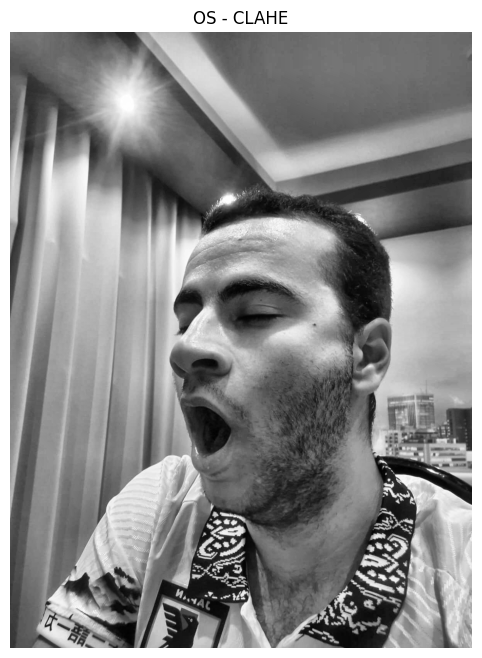

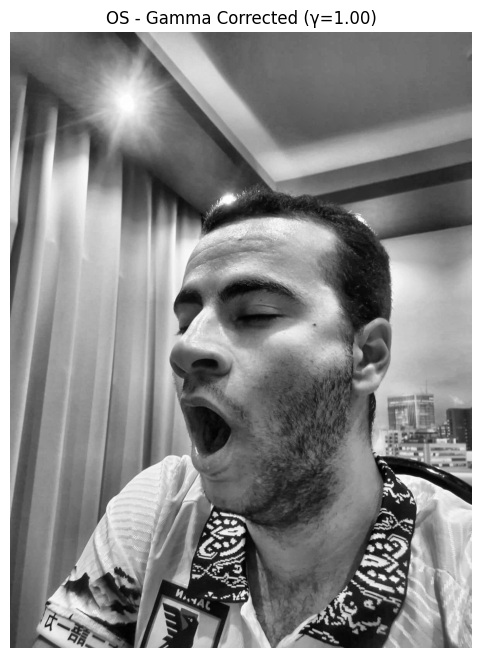

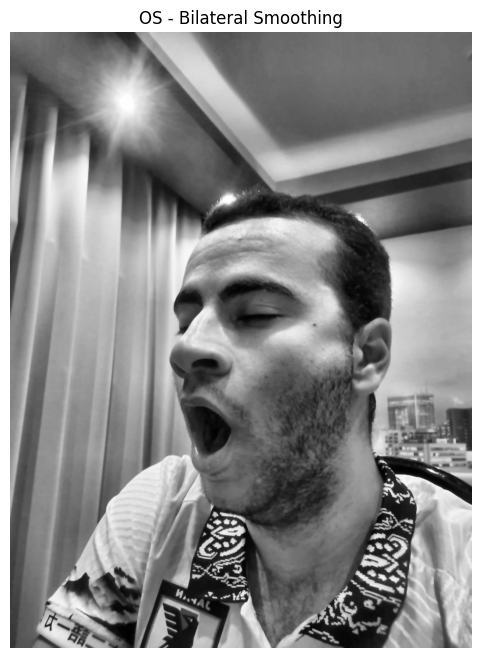

EAR: 0.320, MAR: 1.188
Image 2/8: /kaggle/input/drowsyyy/Imagess/OS/IMG-20250530-WA0017.jpg
EAR: 0.280, MAR: 0.277
Image 3/8: /kaggle/input/drowsyyy/Imagess/OS/IMG-20250530-WA0019.jpg
EAR: 0.343, MAR: 0.004
Image 4/8: /kaggle/input/drowsyyy/Imagess/OS/IMG-20250530-WA0020.jpg
EAR: 0.110, MAR: 0.020
Image 5/8: /kaggle/input/drowsyyy/Imagess/OS/IMG-20250530-WA0022.jpg
EAR: 0.268, MAR: 0.003
Image 6/8: /kaggle/input/drowsyyy/Imagess/OS/IMG-20250530-WA0024.jpg
EAR: 0.332, MAR: 0.000
Image 7/8: /kaggle/input/drowsyyy/Imagess/OS/IMG-20250530-WA0025.jpg
EAR: 0.153, MAR: 1.369
Image 8/8: /kaggle/input/drowsyyy/Imagess/OS/WhatsApp Image 2025-06-03 at 02.23.27_94c4fdf9.jpg
EAR: 0.086, MAR: 0.011

Processing person 'Zorkany' with 9 images
Image 1/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_12_28_Pro.jpg
Showing preprocessing steps for sample image 1 of 'Zorkany'


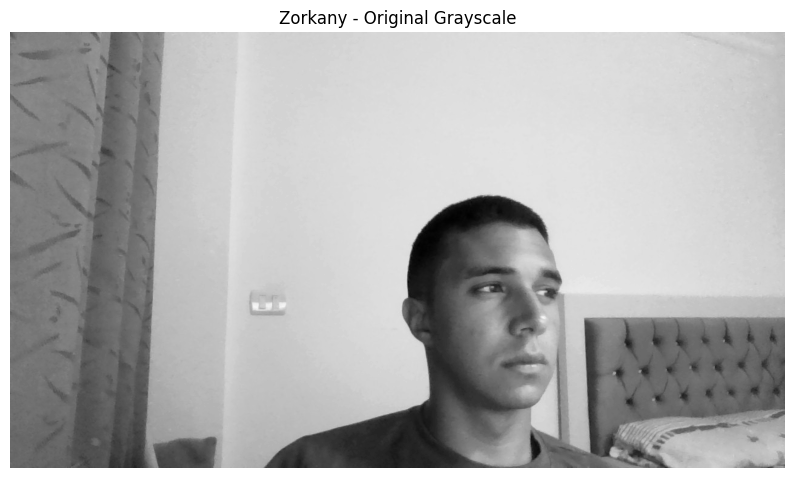

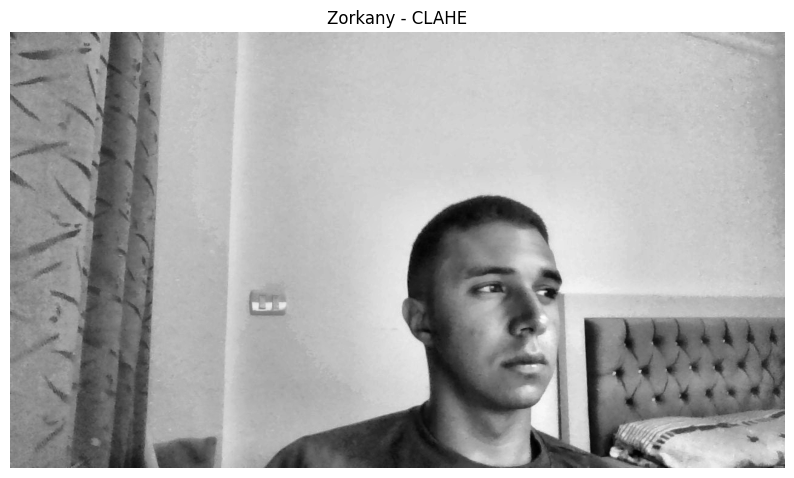

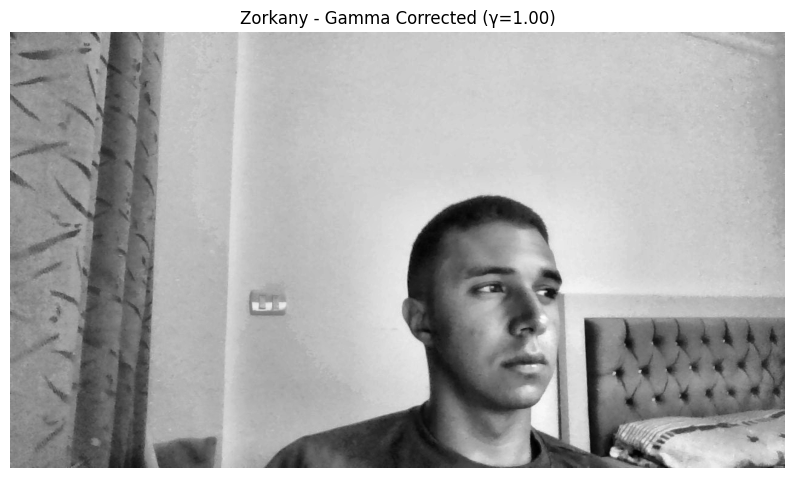

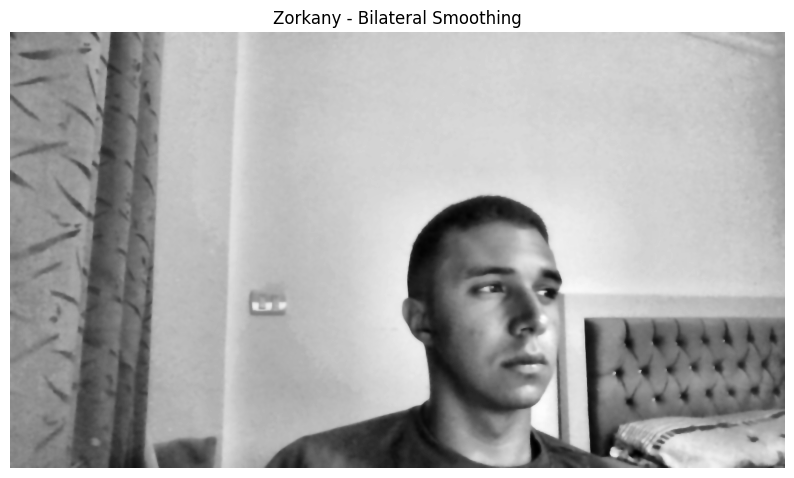

EAR: 0.292, MAR: 0.019
Image 2/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_12_37_Pro.jpg
EAR: 0.147, MAR: 1.318
Image 3/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_12_49_Pro.jpg
EAR: 0.163, MAR: 0.000
Image 4/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_13_17_Pro.jpg
EAR: 0.254, MAR: 0.015
Image 5/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_14_02_Pro.jpg
EAR: 0.208, MAR: 1.707
Image 6/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_14_13_Pro.jpg
EAR: 0.060, MAR: 0.019
Image 7/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_14_28_Pro.jpg
EAR: 0.192, MAR: 0.013
Image 8/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_15_59_Pro.jpg
EAR: 0.101, MAR: 0.014
Image 9/9: /kaggle/input/drowsyyy/Imagess/Zorkany/WIN_20250530_23_16_44_Pro.jpg
EAR: 0.254, MAR: 0.000


In [46]:
import os
from glob import glob

LEFT_EYE_IDX = [362, 385, 387, 263, 373, 380]
RIGHT_EYE_IDX = [33, 160, 158, 133, 153, 144]
MOUTH_IDX = [78, 81, 13, 311, 308, 402, 14, 178]

CALIBRATION_FRAMES = 10  # You can adjust


persons_ears = {}
persons_mars = {}

# List person subfolders
person_folders = [f.path for f in os.scandir(dataset_root) if f.is_dir()]

for person_folder in person_folders:
    person_name = os.path.basename(person_folder)
    image_paths = sorted(glob(os.path.join(person_folder, '*.jpg')))
    print(f"\nProcessing person '{person_name}' with {len(image_paths)} images")

    ears = []
    mars = []
    sample_shown = False

    for idx, img_path in enumerate(image_paths):
        print(f"Image {idx+1}/{len(image_paths)}: {img_path}")
        img = cv2.imread(img_path)
        if img is None:
            print("Failed to load image")
            continue

        # Step 1: Grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Step 2: Adaptive CLAHE
        clahe_img = apply_clahe_adaptive(gray)
        
        # Step 3: Adaptive Gamma Correction
        gamma_img, gamma_val = adjust_gamma_adaptive(clahe_img)
        
        # Step 4: Bilateral Smoothing
        smooth_img = bilateral_smooth(gamma_img)
        
        # Show preprocessing steps only for first image of the person
        if not sample_shown:
            print(f"Showing preprocessing steps for sample image {idx+1} of '{person_name}'")
            show_image(gray, f"{person_name} - Original Grayscale")
            show_image(clahe_img, f"{person_name} - CLAHE")
            show_image(gamma_img, f"{person_name} - Gamma Corrected (γ={gamma_val:.2f})")
            show_image(smooth_img, f"{person_name} - Bilateral Smoothing")
            sample_shown = True

        # Prepare for MediaPipe
        img_rgb = cv2.cvtColor(smooth_img, cv2.COLOR_GRAY2RGB)
        results = face_mesh.process(img_rgb)

        if not results.multi_face_landmarks:
            print("No face detected!")
            continue

        face_landmarks = results.multi_face_landmarks[0]
        h, w = img.shape[:2]
        landmarks = [(int(lm.x * w), int(lm.y * h)) for lm in face_landmarks.landmark]

        left_ear = eye_aspect_ratio(landmarks, LEFT_EYE_IDX)
        right_ear = eye_aspect_ratio(landmarks, RIGHT_EYE_IDX)
        ear = (left_ear + right_ear) / 2.0
        mar = mouth_aspect_ratio(landmarks, MOUTH_IDX)

        ears.append(ear)
        mars.append(mar)

        print(f"EAR: {ear:.3f}, MAR: {mar:.3f}")

    persons_ears[person_name] = ears
    persons_mars[person_name] = mars



Person 'Mo_Drowsy' thresholds - EAR: 0.091, MAR: 0.696


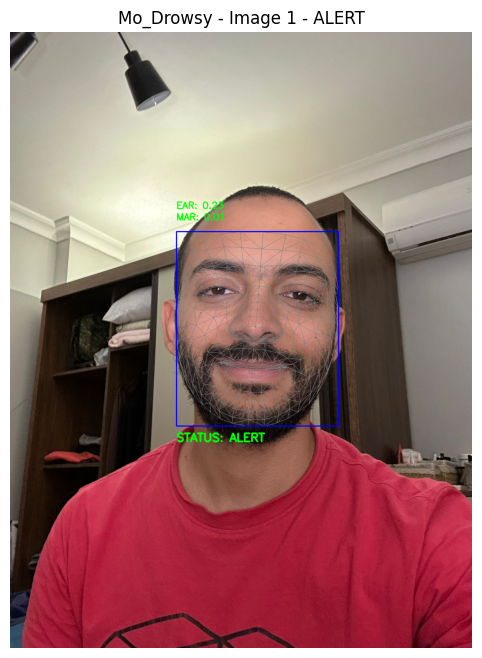

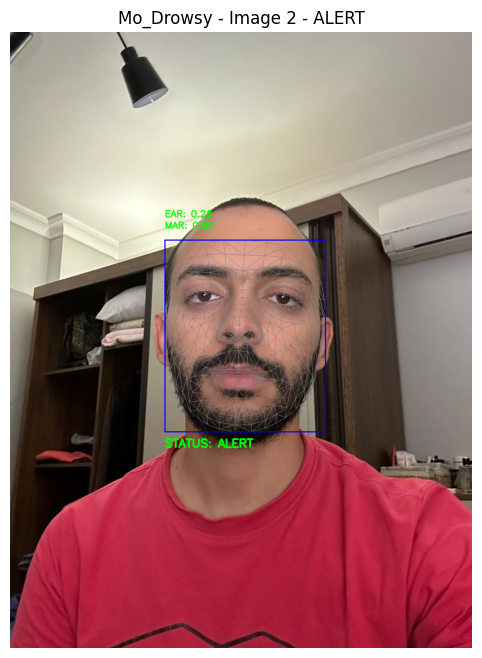

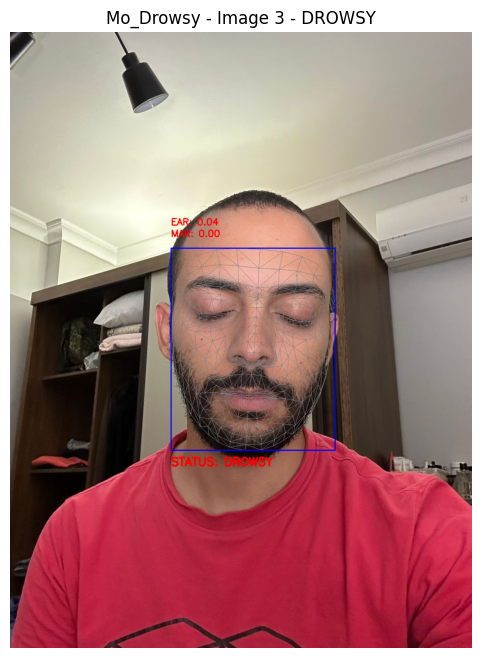

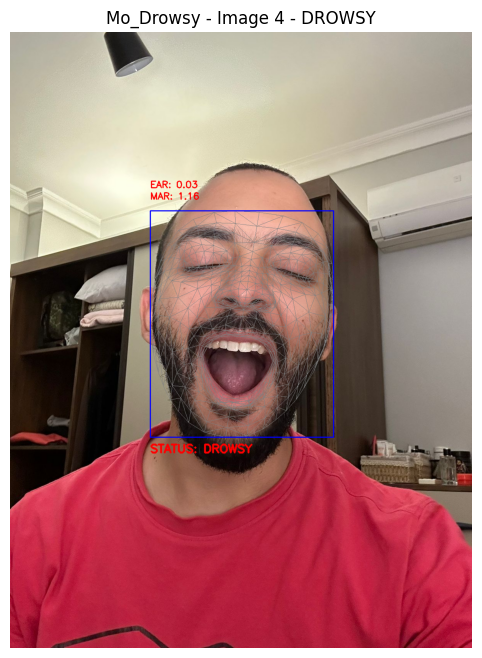

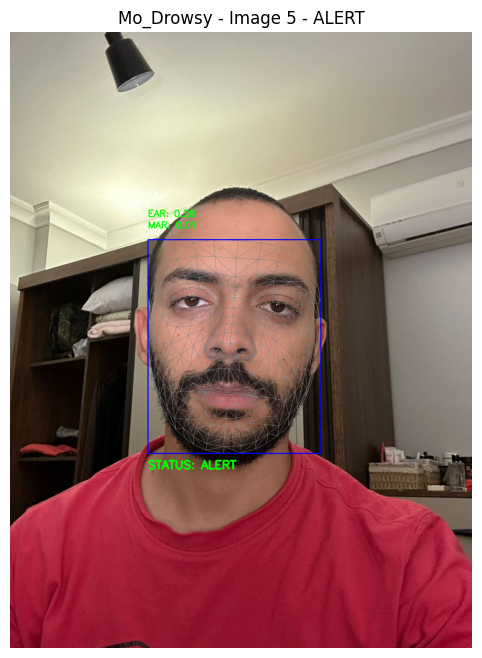

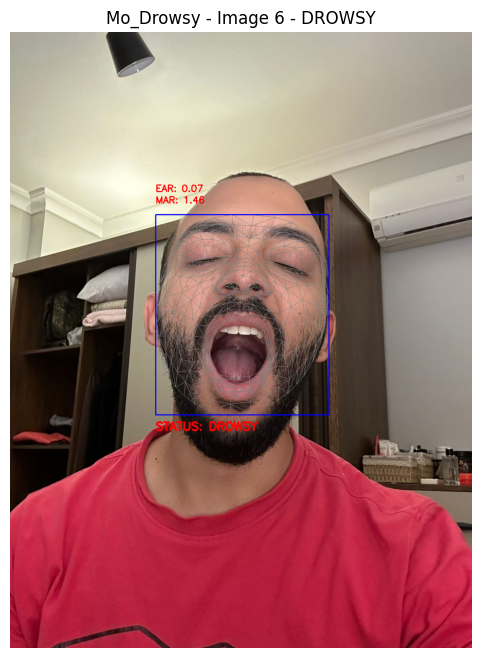

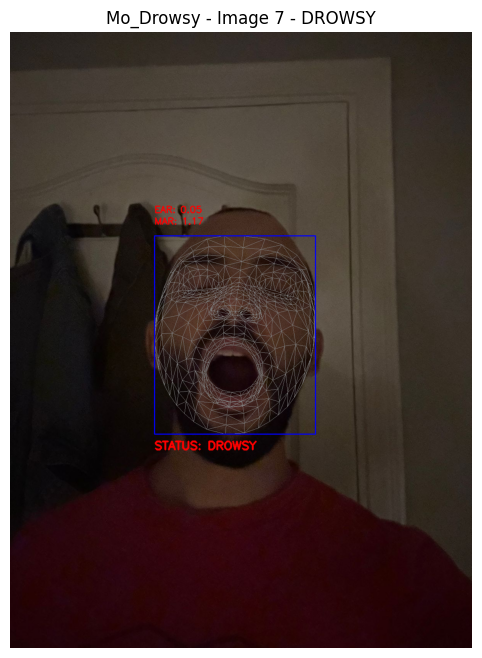

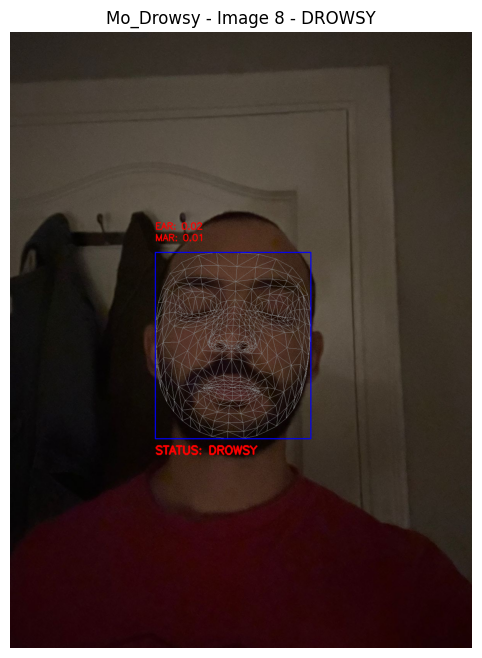

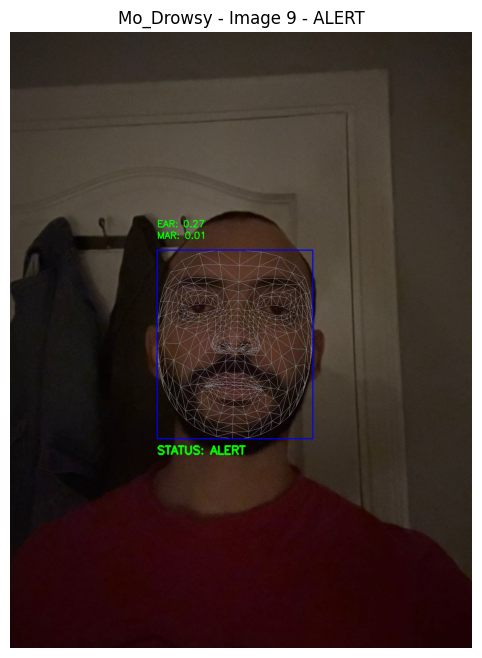

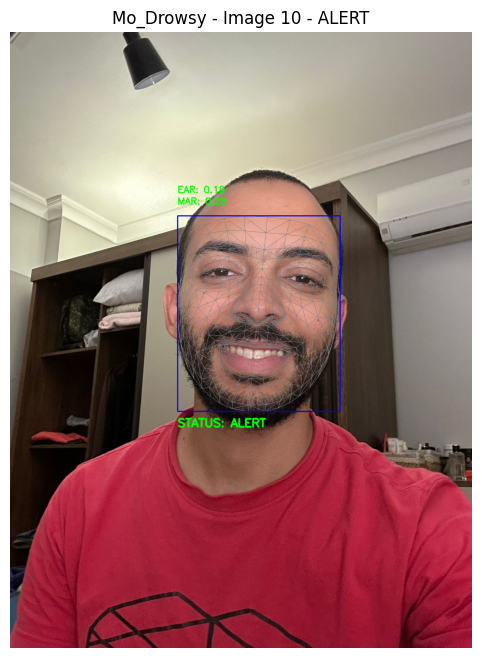


Person 'OS' thresholds - EAR: 0.188, MAR: 0.629


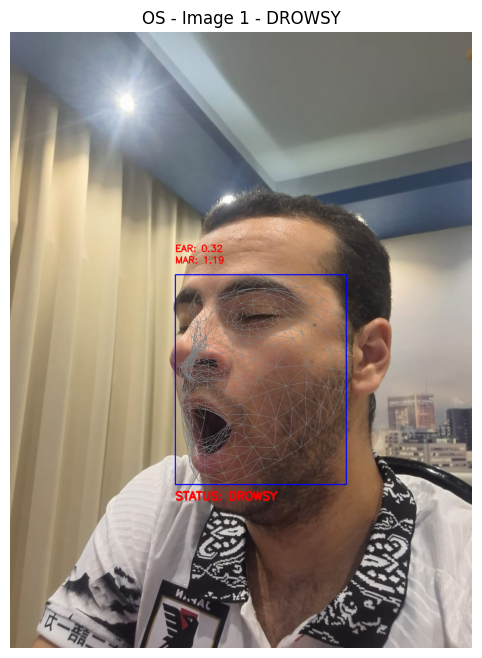

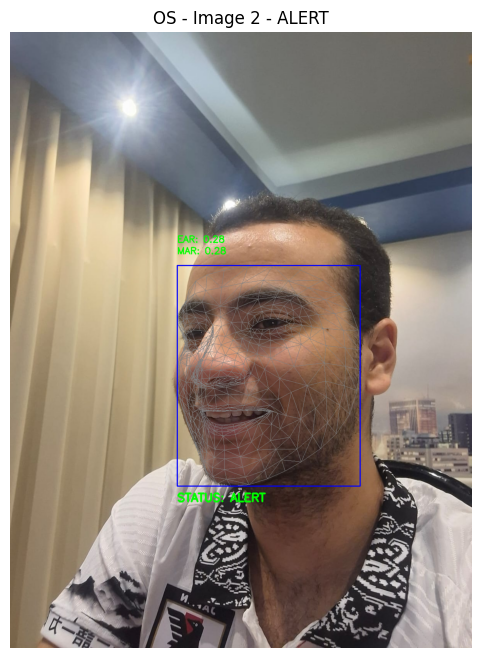

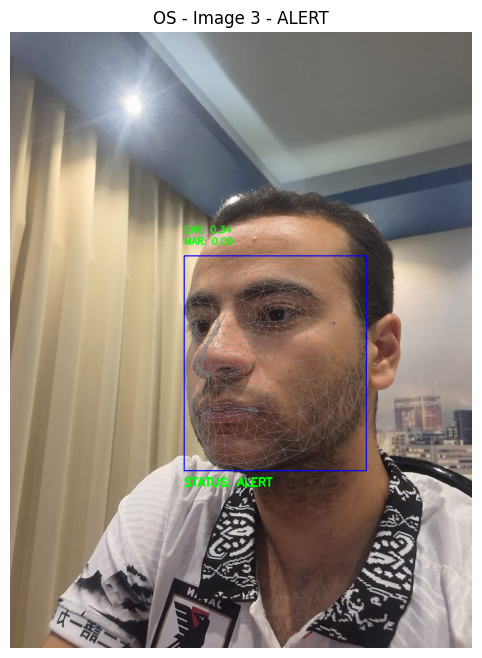

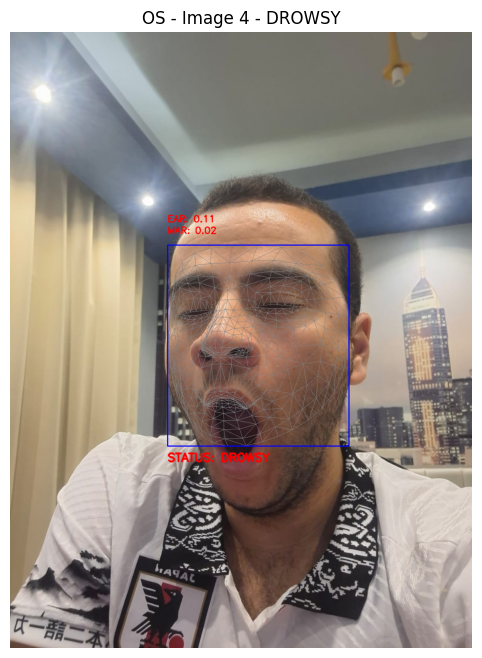

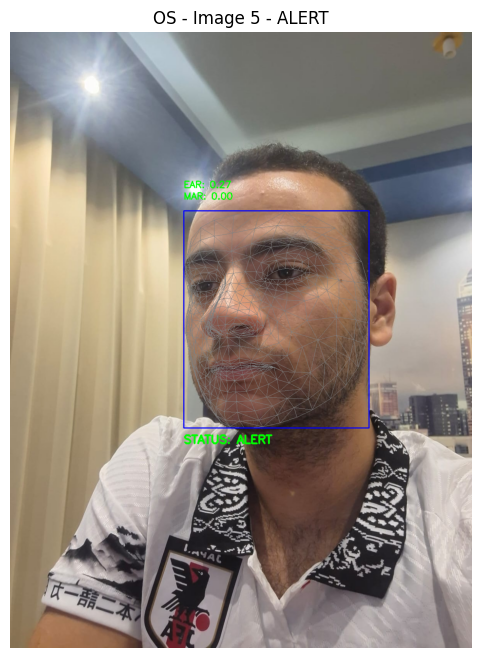

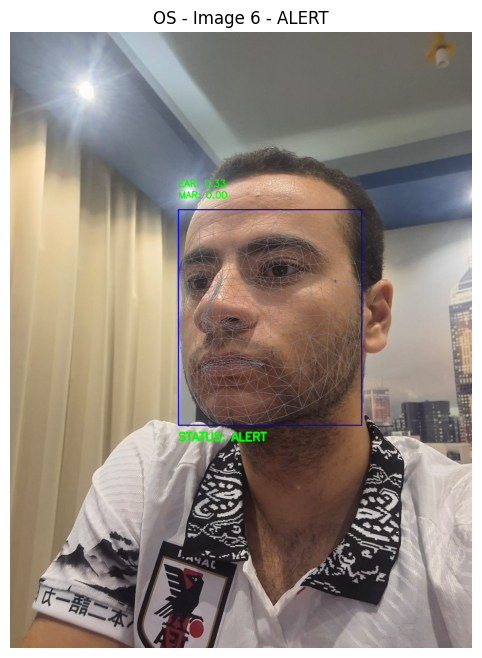

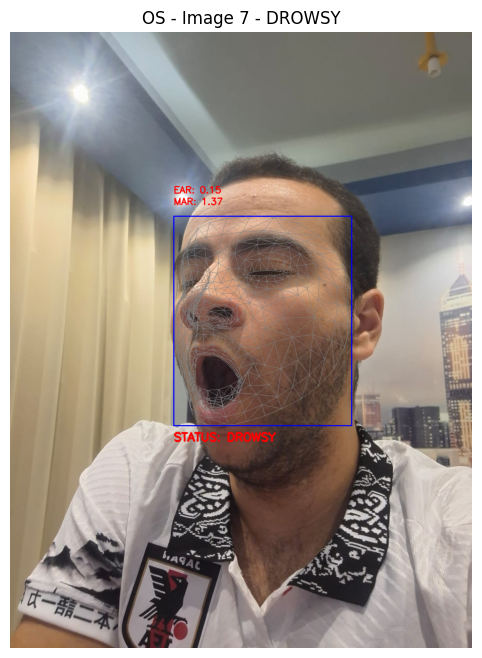

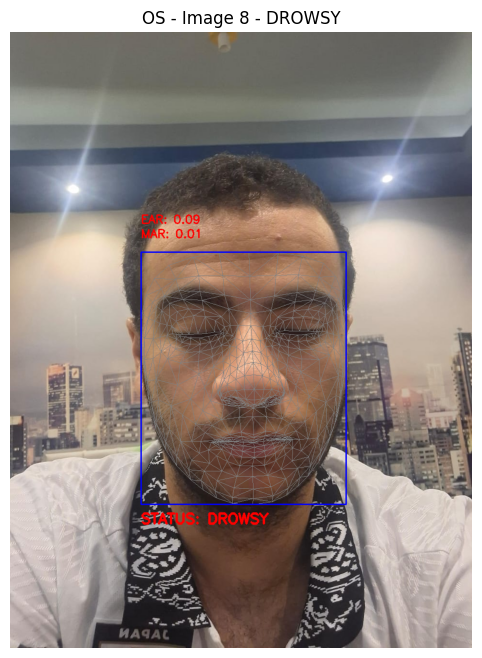


Person 'Zorkany' thresholds - EAR: 0.150, MAR: 0.660


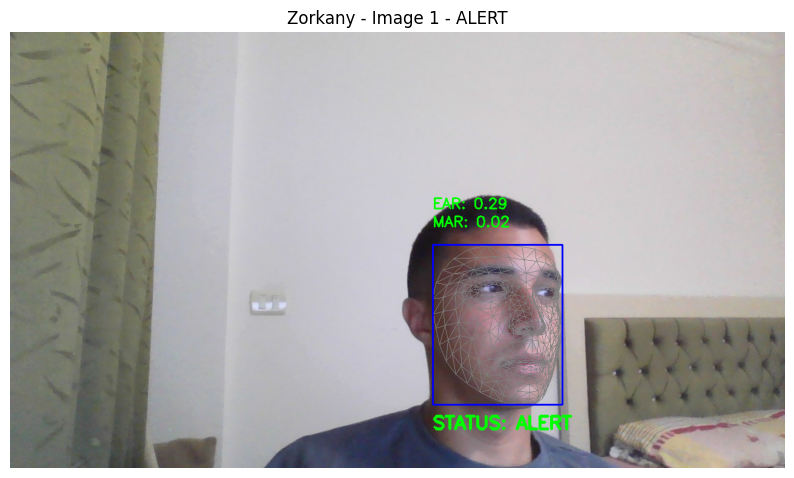

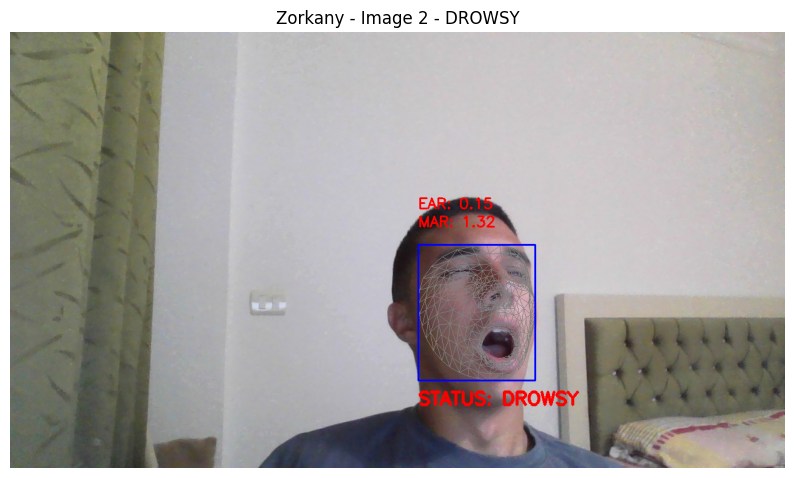

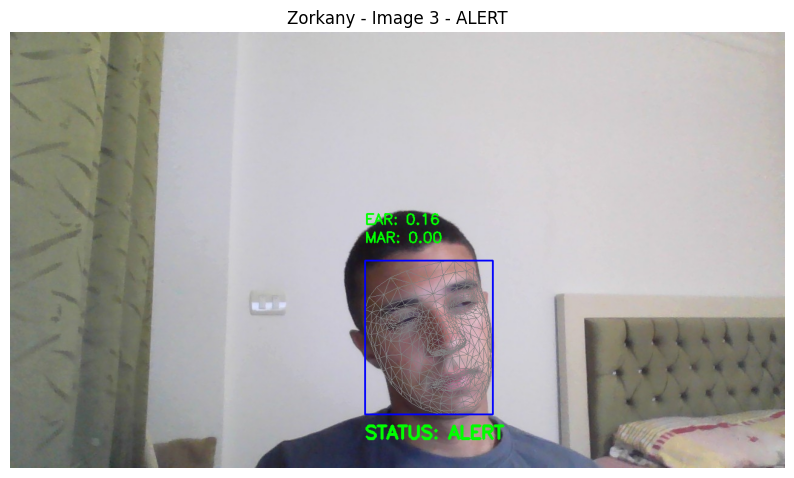

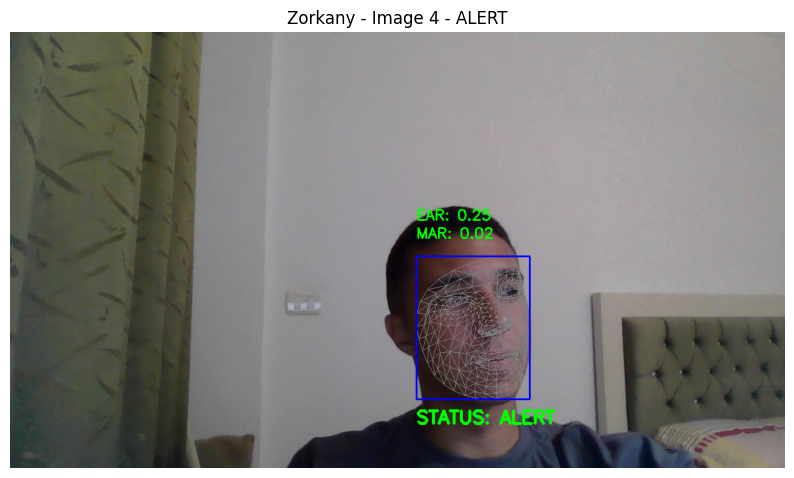

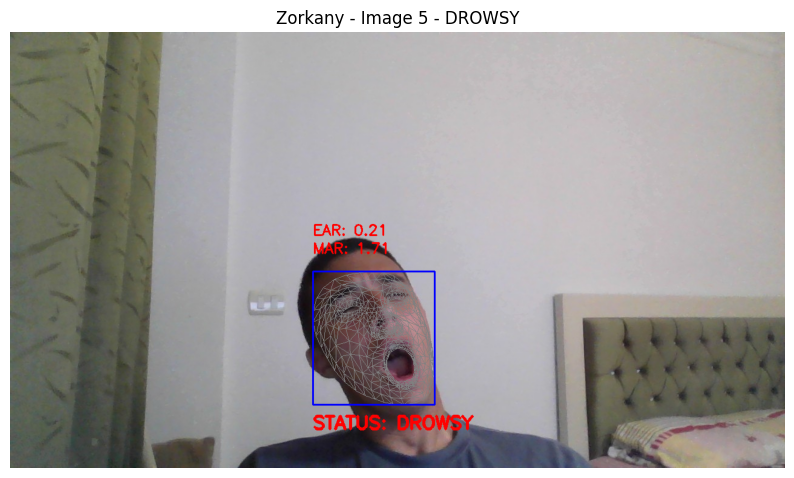

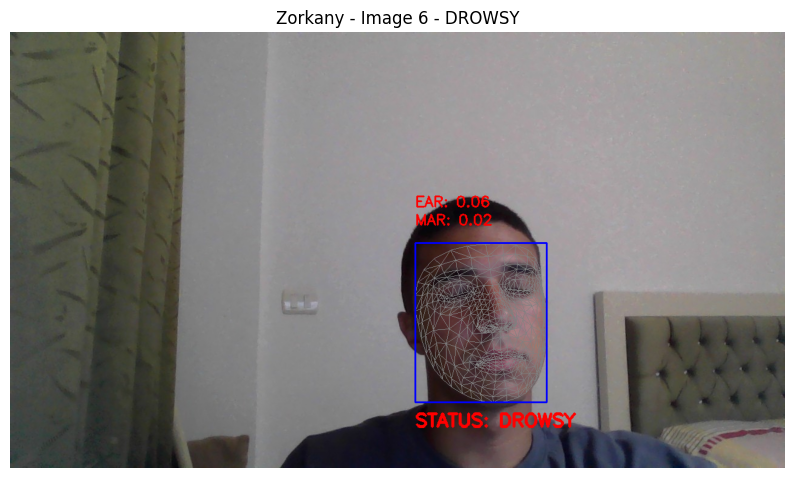

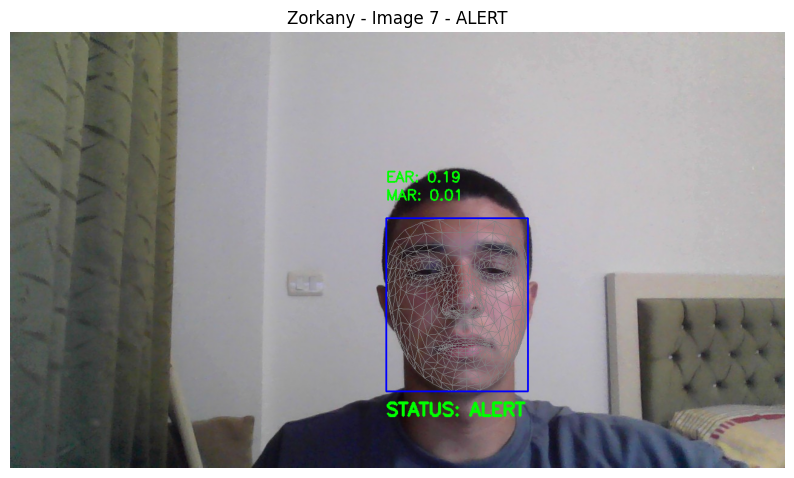

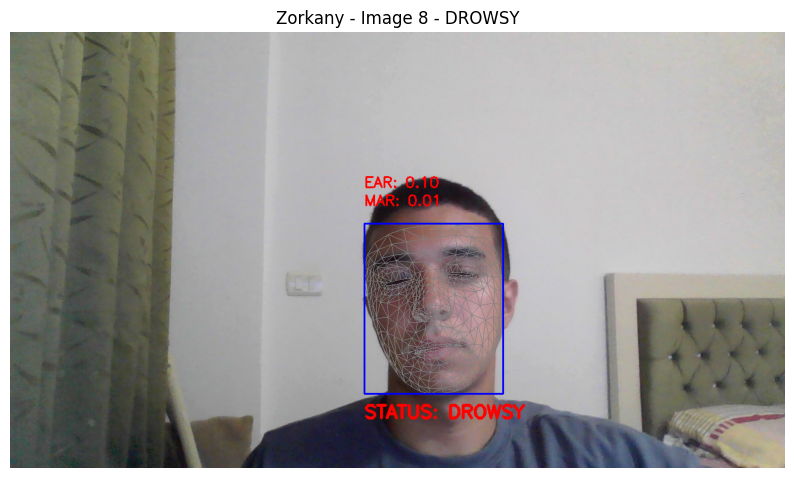

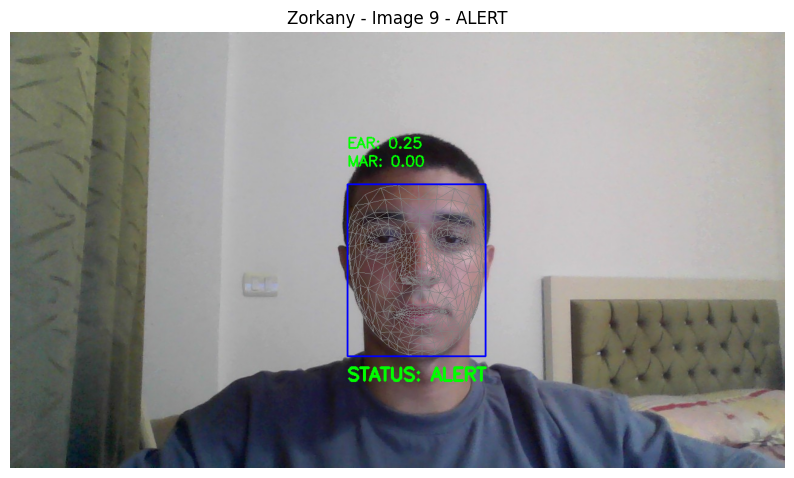

In [47]:
for person_folder in person_folders:
    person_name = os.path.basename(person_folder)
    image_paths = sorted(glob(os.path.join(person_folder, '*.jpg')))
    ears = persons_ears.get(person_name, [])
    mars = persons_mars.get(person_name, [])

    valid_calib_frames = min(10, len(ears), len(mars))

    if valid_calib_frames == 0:
        print(f"No valid calibration data for person '{person_name}'. Skipping visualization.")
        continue

    ear_arr = np.array(ears)
    mar_arr = np.array(mars)

    ear_threshold = np.mean(ear_arr[:valid_calib_frames]) - 0.5 * np.std(ear_arr[:valid_calib_frames])
    mar_threshold = np.mean(mar_arr[:valid_calib_frames]) + 0.5 * np.std(mar_arr[:valid_calib_frames])

    print(f"\nPerson '{person_name}' thresholds - EAR: {ear_threshold:.3f}, MAR: {mar_threshold:.3f}")

    for idx, img_path in enumerate(image_paths):
        img = cv2.imread(img_path)
        if img is None:
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        clahe_img = apply_clahe_adaptive(gray)
        gamma_img, _ = adjust_gamma_adaptive(clahe_img)
        smooth_img = bilateral_smooth(gamma_img)
        img_rgb = cv2.cvtColor(smooth_img, cv2.COLOR_GRAY2RGB)
        results = face_mesh.process(img_rgb)
        output_img = img.copy()

        if not results.multi_face_landmarks:
            cv2.putText(output_img, "No Face Detected", (30, 50),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 3)
            show_image(output_img, f"{person_name} - Image {idx+1} - No Face Detected")
            continue

        face_landmarks = results.multi_face_landmarks[0]
        h, w = output_img.shape[:2]
        landmarks = [(int(lm.x * w), int(lm.y * h)) for lm in face_landmarks.landmark]

        mp_drawing.draw_landmarks(
            output_img,
            face_landmarks,
            mp_face_mesh.FACEMESH_TESSELATION,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style())

        xs = [p[0] for p in landmarks]
        ys = [p[1] for p in landmarks]
        x_min, x_max = min(xs), max(xs)
        y_min, y_max = min(ys), max(ys)
        cv2.rectangle(output_img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

        ear = ear_arr[idx]
        mar = mar_arr[idx]

        # Drowsiness condition: EAR low OR MAR high
        state = "DROWSY" if (ear < ear_threshold or mar > mar_threshold) else "ALERT"
        color = (0, 0, 255) if state == "DROWSY" else (0, 255, 0)

        cv2.putText(output_img, f"EAR: {ear:.2f}", (x_min, y_min - 60),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
        cv2.putText(output_img, f"MAR: {mar:.2f}", (x_min, y_min - 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
        cv2.putText(output_img, f"STATUS: {state}", (x_min, y_max + 40),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.0, color, 3)

        show_image(output_img, f"{person_name} - Image {idx+1} - {state}")
